In [1]:
import numpy as np
import pandas as pd

df=pd.read_excel('X030_60.xlsx')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27938 entries, 0 to 27937
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Tarih     27938 non-null  object 
 1   Saat      27938 non-null  object 
 2   Açılış    27938 non-null  float64
 3   Yüksek    27938 non-null  float64
 4   Düşük     27938 non-null  float64
 5   Kapanış   27938 non-null  float64
 6   Ortalama  27938 non-null  float64
 7   Hacim     27938 non-null  int64  
 8   Lot       27938 non-null  int64  
dtypes: float64(5), int64(2), object(2)
memory usage: 1.9+ MB


In [2]:
df['datetime'] = pd.to_datetime(df['Tarih'].astype(str) + ' ' + df['Saat'].astype(str), format='%d.%m.%Y %H:%M:%S')
df['datetime']

0       2011-06-30 17:00:00
1       2011-07-01 09:00:00
2       2011-07-01 10:00:00
3       2011-07-01 11:00:00
4       2011-07-01 12:00:00
                ...        
27933   2024-02-02 14:00:00
27934   2024-02-02 15:00:00
27935   2024-02-02 16:00:00
27936   2024-02-02 17:00:00
27937   2024-02-02 18:00:00
Name: datetime, Length: 27938, dtype: datetime64[ns]

In [3]:
df=df.drop(['Tarih','Saat'],axis=1) 
df=df.set_index('datetime')
df

,Açılış,Yüksek,Düşük,Kapanış,Ortalama,Hacim,Lot
datetime,,,,,,,
2011-06-30 17:00:00,773.49,773.83,766.36,769.30,4.583117,304201900,66374450
2011-07-01 09:00:00,770.73,772.70,770.15,770.90,5.008978,51103450,10202370
2011-07-01 10:00:00,770.55,771.11,765.10,765.10,4.633569,178559500,38536060
2011-07-01 11:00:00,765.08,767.10,764.06,766.97,4.756497,102626700,21576110
2011-07-01 12:00:00,767.06,767.42,765.68,766.78,5.777752,29293460,5070044
...,...,...,...,...,...,...,...
2024-02-02 14:00:00,9314.82,9338.08,9292.22,9301.30,47.831520,5388488000,112655600
2024-02-02 15:00:00,9300.07,9317.63,9249.24,9265.61,45.976980,7323126000,159278100
2024-02-02 16:00:00,9264.13,9284.67,9210.28,9226.20,44.680910,7169691000,160464300


In [4]:
df=df.drop(['Tarih','Saat'],axis=1) 
df=df.set_index('datetime')
df

KeyError: "['Tarih', 'Saat'] not found in axis"

In [5]:
import matplotlib.pyplot as plt
(100*((np.exp(df.co_log_ret.groupby(df.index.hour).mean()))-1)).plot(kind='bar',figsize=(10,5))
plt.title('Mean percentage return by hour')

AttributeError: 'DataFrame' object has no attribute 'co_log_ret'

In [6]:
df['ho_log_ret']=np.log(df.Yüksek/df.Açılış)
df['lo_log_ret']=np.log(df.Düşük/df.Açılış)


Text(0.5, 1.0, 'Mean upside-downide log return volatility by hour')

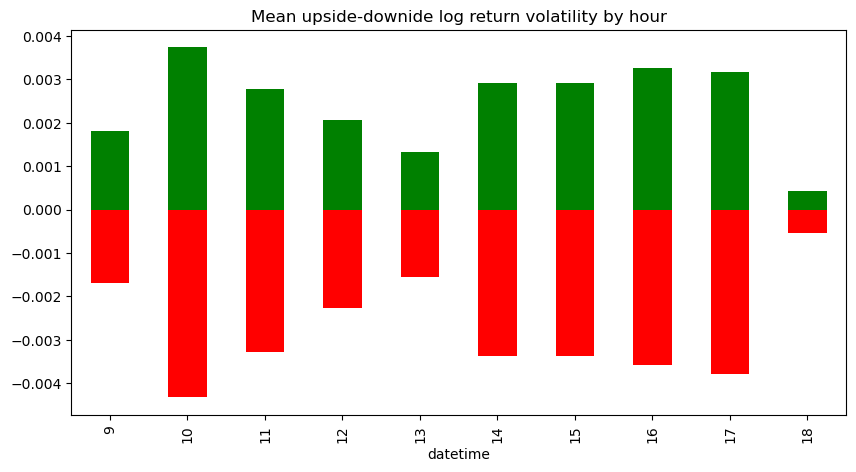

In [7]:
(df.lo_log_ret.groupby(df.index.hour).mean()).plot(kind='bar',figsize=(10,5), color='red')
df.ho_log_ret.groupby(df.index.hour).mean().plot(kind='bar',figsize=(10,5),color='green')    
plt.title('Mean upside-downide log return volatility by hour')

In [8]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))

for year in df.index.year.unique()[-5:]:
    df_year = df[df.index.year == year]
    df_year_co_log_ret_mean = df_year.co_log_ret.groupby(df_year.index.hour).mean()
    plt.plot(df_year_co_log_ret_mean.index, df_year_co_log_ret_mean.values, label=str(year))
plt.title('Hourly log return Mean by Year(last five years)')
plt.xlabel('Hour')
plt.ylabel('Mean co_log_ret')
plt.legend(title='Year')
plt.xticks(range(9, 19))  
plt.grid(True)

plt.show()


AttributeError: 'DataFrame' object has no attribute 'co_log_ret'

<Figure size 2000x1000 with 0 Axes>

In [9]:
daily=df[['Açılış','Kapanış','Yüksek','Düşük','Lot']].resample('D').agg({'Açılış':'first','Kapanış':'last','Yüksek':'max','Düşük':'min'}).dropna()
daily['co_log_ret']=np.log(daily.Kapanış/daily.Açılış)
daily['gap_log_ret']=np.log(daily.Açılış/daily.Kapanış.shift(1))
daily=daily.dropna()
daily

,Açılış,Kapanış,Yüksek,Düşük,co_log_ret,gap_log_ret
datetime,,,,,,
2011-07-01,770.73,769.22,772.70,764.06,-0.001961,0.001857
2011-07-04,770.19,783.11,783.11,769.97,0.016636,0.001260
2011-07-05,779.91,778.68,783.48,776.25,-0.001578,-0.004095
2011-07-06,776.94,769.72,777.52,768.58,-0.009336,-0.002237
2011-07-07,772.93,781.41,783.26,766.29,0.010911,0.004162
...,...,...,...,...,...,...
2024-01-29,9034.90,9108.00,9138.21,9031.15,0.008058,0.006148
2024-01-30,9150.53,9092.32,9152.19,9065.93,-0.006382,0.004659
2024-01-31,9096.33,9103.13,9203.17,9046.85,0.000747,0.000441


In [10]:
(daily.gap_log_ret.mean())

0.0017019354325284147

Text(0.5, 1.0, '10 days rolling mean gap percentage return')

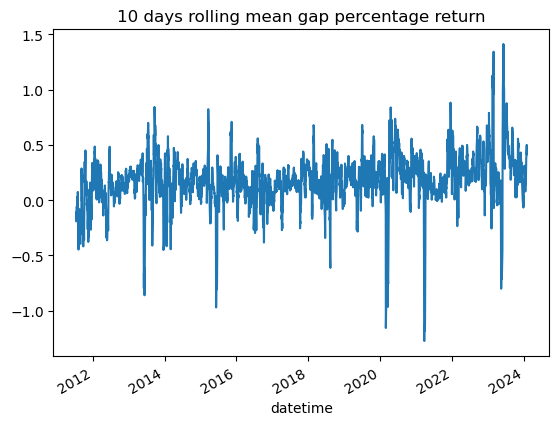

In [11]:
(100*(np.exp(daily.gap_log_ret.rolling(10).mean())-1)).plot()
plt.title('10 days rolling mean gap percentage return')

Text(0.5, 1.0, 'Total return of the index (buy and hold)')

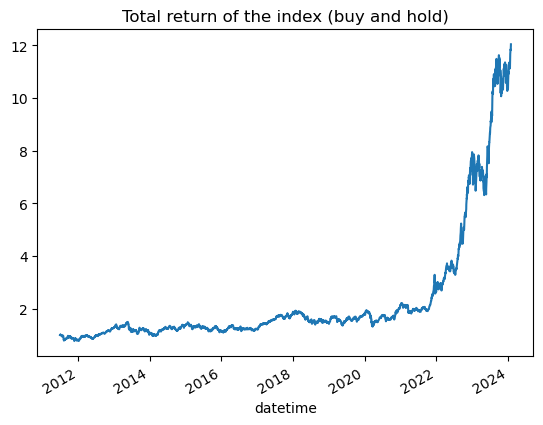

In [12]:
daily['total_log_ret']=(daily.co_log_ret+daily.gap_log_ret)
np.exp(daily['total_log_ret'].cumsum()).plot()
plt.title('Total return of the index (buy and hold)')

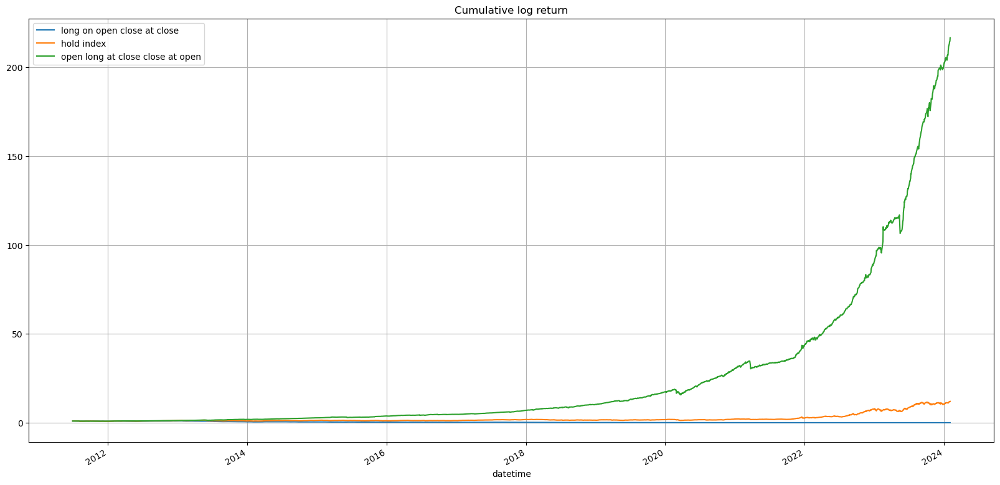

In [14]:
plt.figure(figsize=(20, 10))
np.exp(daily.co_log_ret.cumsum()).plot()
np.exp(daily.total_log_ret.cumsum()).plot()
np.exp(daily.gap_log_ret.cumsum()).plot()
plt.title('Cumulative log return')
plt.legend(['long on open close at close','hold index','open long at close close at open'])
plt.grid(True)
plt.show()

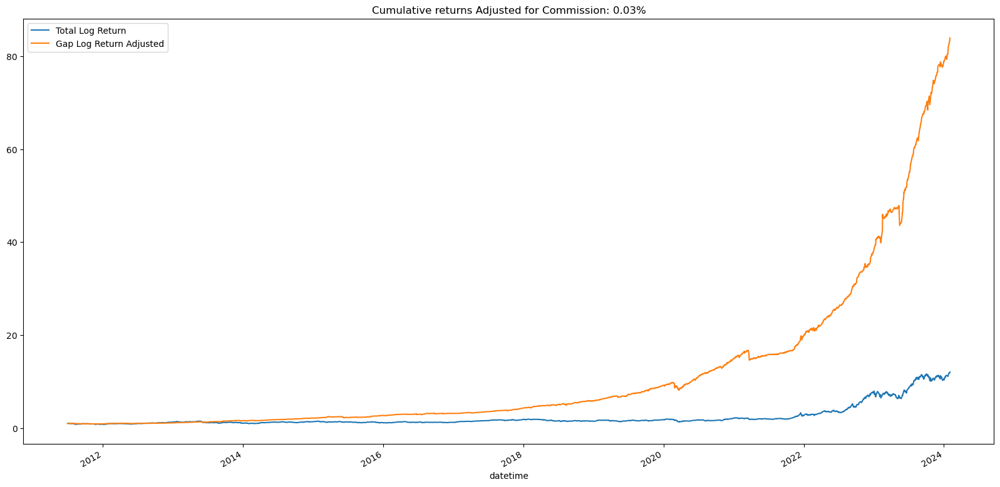

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
commission=0.0003
commission_log=np.exp(commission)-1

daily['co_log_ret_adj'] = daily['co_log_ret'] - commission_log
daily['gap_log_ret_adj'] = daily['gap_log_ret'] - commission_log

#np.exp(daily['co_log_ret_adj'].cumsum()).plot(label='Short intraday Return Adjusted')
np.exp(daily['total_log_ret'].cumsum()).plot(label='Total Log Return')
np.exp(daily['gap_log_ret_adj'].cumsum()).plot(label='Gap Log Return Adjusted')

plt.legend()
plt.title(f'Cumulative returns Adjusted for Commission: {commission:.2%}')
plt.show()


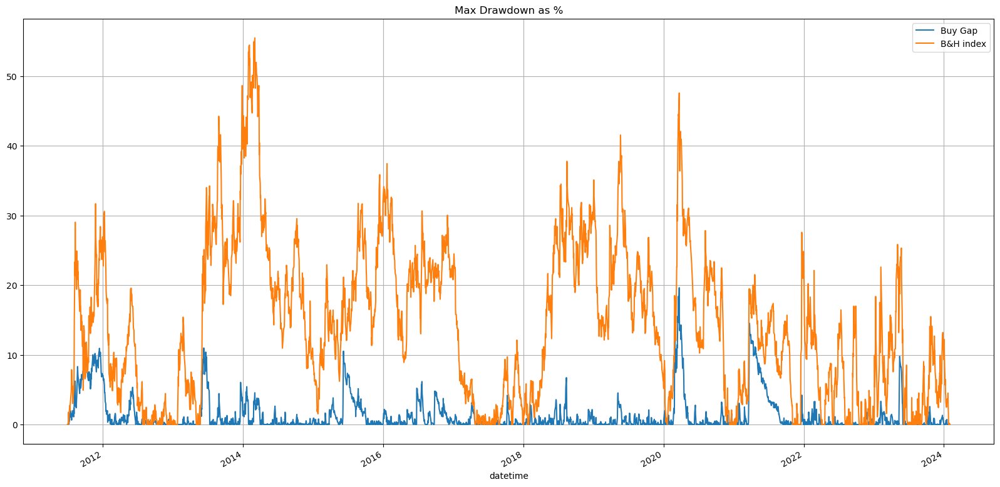

In [38]:
plt.figure(figsize=(20,10))
daily['gap_adj_max_dd']=pd.Series(np.exp((daily.gap_log_ret.cumsum()))).cummax()-pd.Series(np.exp(daily.gap_log_ret.cumsum()))
daily['index_max_dd']=pd.Series(np.exp((daily.total_log_ret.cumsum()))).cummax()-pd.Series(np.exp(daily.total_log_ret.cumsum()))
#daily['co_adj_max_dd']=pd.Series(np.exp((daily.co_log_ret.cumsum()))).cummax()-pd.Series(np.exp(daily.co_log_ret.cumsum()))

(100*(daily['gap_adj_max_dd']/np.exp(daily['gap_log_ret'].cumsum()))).plot()
(100*(daily['index_max_dd']/np.exp(daily['total_log_ret'].cumsum()))).plot()
#(100*(daily['co_adj_max_dd']/np.exp(daily['co_log_ret_adj'].cumsum()))).plot()
plt.grid(True)
plt.title('Max Drawdown as %')
plt.legend(['Buy Gap','B&H index'])
plt.show()


<Axes: xlabel='datetime'>

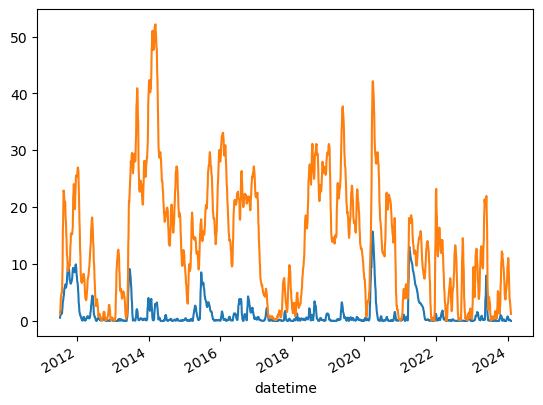

In [39]:
dd_gap=(100*(daily['gap_adj_max_dd']/np.exp(daily['gap_log_ret'].cumsum())))
dd_index=(100*(daily['index_max_dd']/np.exp(daily['total_log_ret'].cumsum())))
dd_gap.rolling(10).mean().plot()
dd_index.rolling(10).mean().plot()  

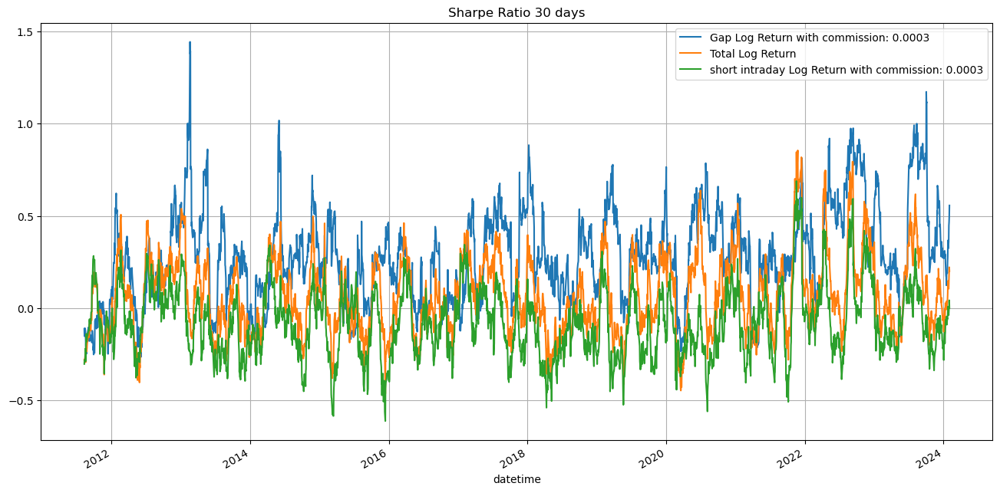

In [40]:
plt.figure(figsize=(16,8))
metric_period=30
(daily.gap_log_ret_adj.rolling(metric_period).mean()/daily.gap_log_ret_adj.rolling(metric_period).std()).plot()
((daily.total_log_ret).rolling(metric_period).mean()/(daily.total_log_ret).rolling(metric_period).std()).plot()
(daily.co_log_ret_adj.rolling(metric_period).mean()/daily.co_log_ret_adj.rolling(metric_period).std()).plot()
plt.title(f'Sharpe Ratio {metric_period} days')
plt.grid(True)
plt.legend([f'Gap Log Return with commission: {commission}','Total Log Return',f'short intraday Log Return with commission: {commission}'])

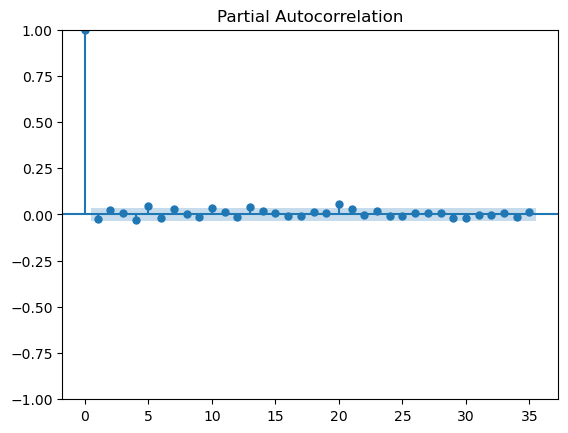

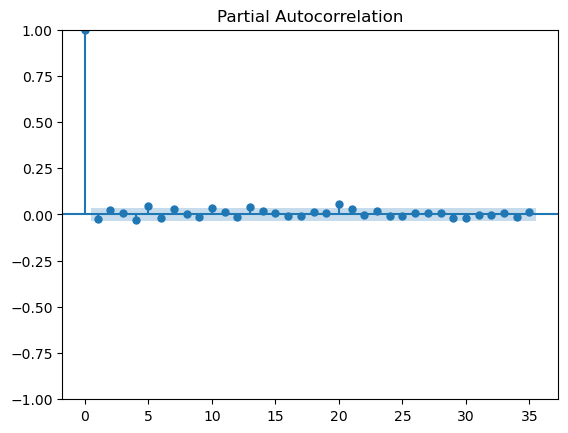

In [41]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
plot_pacf(daily['gap_log_ret'])

In [42]:
#testing the startegies that we buy the gap and sell at the close of every hour
rets=df[['co_log_ret']]
rets=pd.concat([rets['co_log_ret'],daily['gap_log_ret']], axis=1).fillna(0).dropna()
rets

rets

,co_log_ret,gap_log_ret
datetime,,
2011-06-30 17:00:00,-0.005432,0.000000
2011-07-01 00:00:00,0.000000,0.001857
2011-07-01 09:00:00,0.000221,0.000000
2011-07-01 10:00:00,-0.007098,0.000000
2011-07-01 11:00:00,0.002467,0.000000
...,...,...
2024-02-02 14:00:00,-0.001453,0.000000
2024-02-02 15:00:00,-0.003712,0.000000
2024-02-02 16:00:00,-0.004103,0.000000


<Axes: xlabel='datetime'>

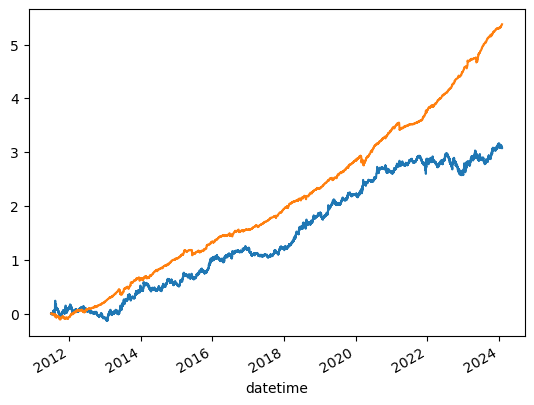

In [43]:
#cum log returns of the short the day and buy the gap
(-rets.co_log_ret).cumsum().plot()
(rets.gap_log_ret).cumsum().plot()

In [44]:
(np.exp((-daily.co_log_ret+daily.gap_log_ret).mean())-1)/(np.exp((-daily.co_log_ret+daily.gap_log_ret).std())-1)

0.15341769449846107

In [45]:
(np.exp((-daily.co_log_ret+daily.gap_log_ret))-1).mean()/(np.exp((-daily.co_log_ret+daily.gap_log_ret))-1).std()

0.1626269410603731

In [46]:
(100*(np.exp((-rets.co_log_ret+rets.gap_log_ret).groupby(rets.index.day)-1)).mean()).plot(kind='bar',figsize=(10,5))

TypeError: unsupported operand type(s) for -: 'SeriesGroupBy' and 'int'

<Axes: xlabel='datetime'>

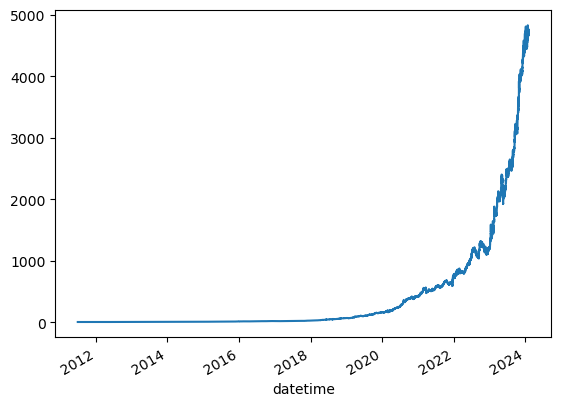

In [ ]:
#cum log returns of the short the day and buy the gap
(np.exp((-rets.co_log_ret+rets.gap_log_ret).cumsum())).plot()

In [ ]:
rets[rets.gap_log_ret==0]

,co_log_ret,gap_log_ret
datetime,,
2011-06-30 17:00:00,-0.005432,0.0
2011-07-01 09:00:00,0.000221,0.0
2011-07-01 10:00:00,-0.007098,0.0
2011-07-01 11:00:00,0.002467,0.0
2011-07-01 12:00:00,-0.000365,0.0
...,...,...
2024-02-02 14:00:00,-0.001453,0.0
2024-02-02 15:00:00,-0.003712,0.0
2024-02-02 16:00:00,-0.004103,0.0


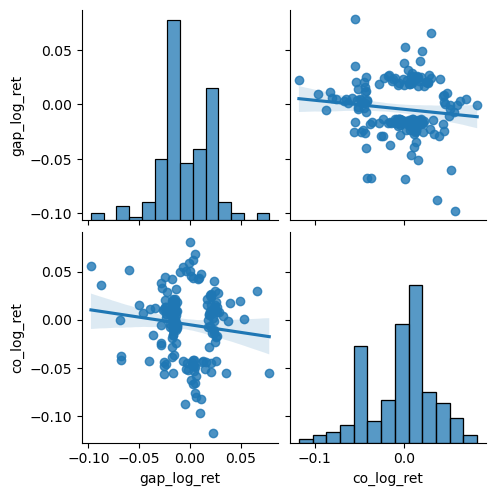

In [ ]:
import seaborn as sns
import pandas as pd

Q1 = daily[['gap_log_ret', 'co_log_ret']].quantile(0.2)
Q3 = daily[['gap_log_ret', 'co_log_ret']].quantile(0.8)
IQR = Q3 - Q1

outliers = ((daily[['gap_log_ret', 'co_log_ret']] < (Q1 - 1.5 * IQR)) | (daily[['gap_log_ret', 'co_log_ret']] > (Q3 + 1.5 * IQR))).any(axis=1)

daily_filtered = daily[outliers]

sns.pairplot(daily_filtered[['gap_log_ret', 'co_log_ret']], kind='reg')


<Axes: xlabel='datetime'>

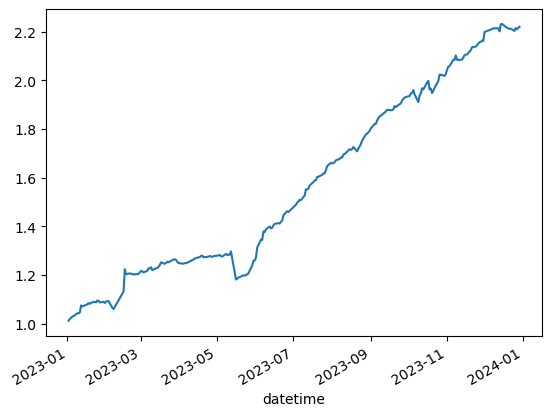

In [48]:
(np.exp(daily[daily.index.year==2023].gap_log_ret.cumsum())).plot()

In [ ]:
rets.index.hour.value_counts()

0     3160
10    3155
11    3154
12    3154
17    3134
16    3132
15    3131
14    3130
9     2118
13    2033
18    1797
Name: datetime, dtype: int64

<Axes: xlabel='datetime'>

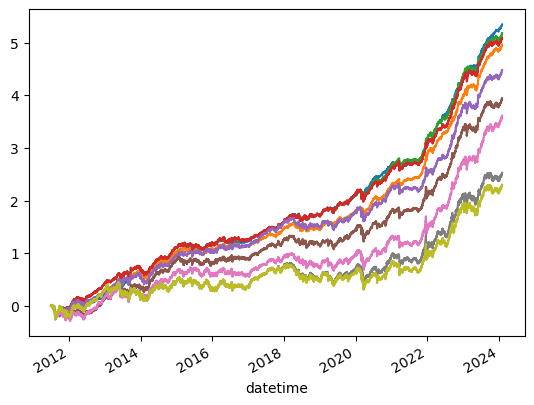

In [ ]:
(np.where(rets.index.hour<=10,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()
(np.where(rets.index.hour<=11,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()
(np.where(rets.index.hour<=12,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()
(np.where(rets.index.hour<=13,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()
(np.where(rets.index.hour<=14,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()
(np.where(rets.index.hour<=15,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()
(np.where(rets.index.hour<=16,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()
(np.where(rets.index.hour<=17,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()
(np.where(rets.index.hour<=18,rets.co_log_ret,0)+rets.gap_log_ret).cumsum().plot()


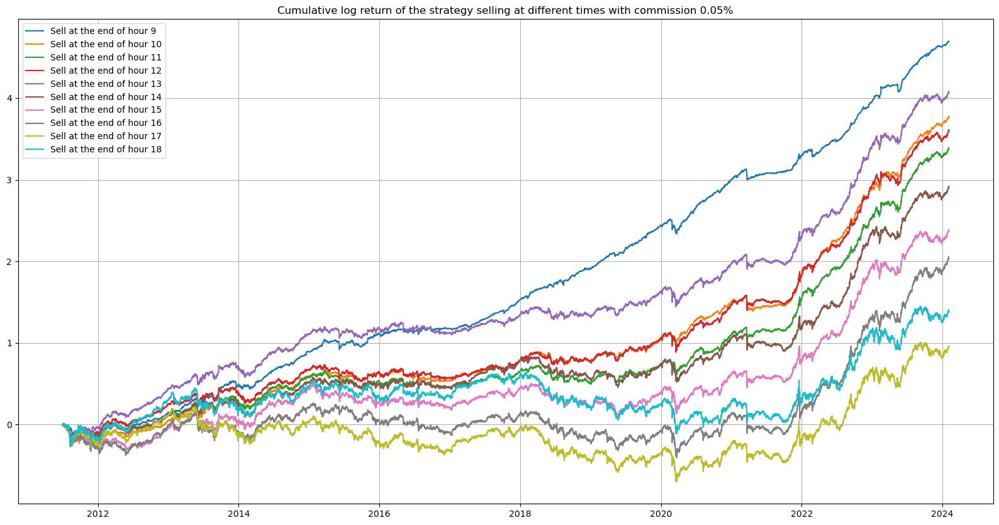

In [ ]:
commission=0.0005
commission_log=np.log(1+commission)
plt.figure(figsize=(20,10))
legend=[]   
for i in range(9,19):
    #rets=rets.loc[rets.index.year>2021]
    ret=(np.where(rets.index.hour<=i,rets.co_log_ret,0)+rets.gap_log_ret-np.where(rets.index.hour==i,1,0)*commission_log).cumsum()
    legend.append(f'Sell at the end of hour {i}')
    plt.plot((ret))
plt.legend(legend)
plt.title(f'Cumulative log return of the strategy selling at different times with commission {commission:.2%}')
plt.grid(True)
plt.show()

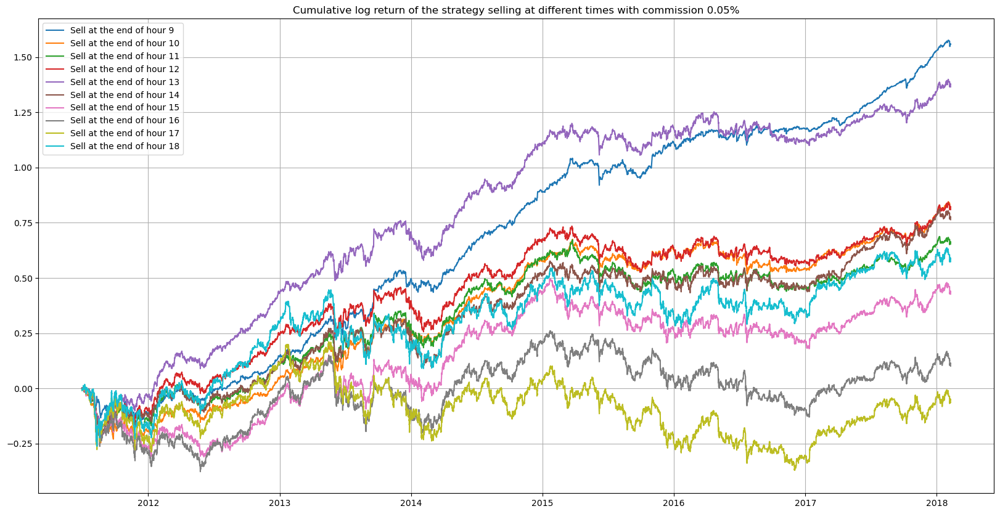

In [ ]:
commission=0.0005
commission_log=np.log(1+commission)
plt.figure(figsize=(20,10))
legend=[]   
for i in range(9,19):
    #rets=rets.loc[rets.index.year>2021]
    ret=(np.where(rets.index.hour<=i,rets.co_log_ret,0)+rets.gap_log_ret-np.where(rets.index.hour==i,1,0)*commission_log).cumsum()
    legend.append(f'Sell at the end of hour {i}')
    plt.plot((ret.iloc[:int(ret.shape[0]/2)]))
plt.legend(legend)
plt.title(f'Cumulative log return of the strategy selling at different times with commission {commission:.2%}')
plt.grid(True)
plt.show()

In [ ]:
commission=0.0005
commission_log=np.log(1+commission)
plt.figure(figsize=(20,10))
legend=[]   
for i in range(9,19):
    #rets=rets.loc[rets.index.year>2021]
    ret=(np.where(rets.index.hour<=i,rets.co_log_ret,0)+rets.gap_log_ret-np.where(rets.index.hour==i,1,0)*commission_log).cumsum()
    legend.append(f'Sell at the end of hour {i}')
    plt.plot((ret))
plt.legend(legend)
plt.title(f'Cumulative log return of the strategy selling at different times with commission {commission:.2%}')
plt.grid(True)
plt.show()

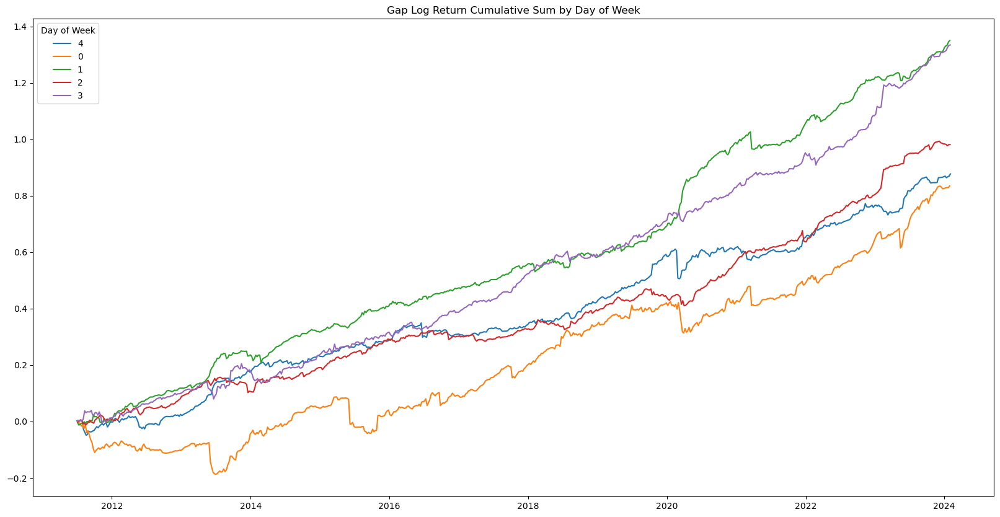

In [ ]:

plt.figure(figsize=(20, 10))

for day in daily.index.dayofweek.unique():
    daily_day = daily[daily.index.dayofweek == day]
    plt.plot(daily_day.index, daily_day.gap_log_ret.cumsum(), label=str(day))
#daily.groupby(daily.index.dayofweek).co_log_ret.mean().plot(kind='bar')
plt.legend(title='Day of Week')
plt.title('Gap Log Return Cumulative Sum by Day of Week')
plt.show()

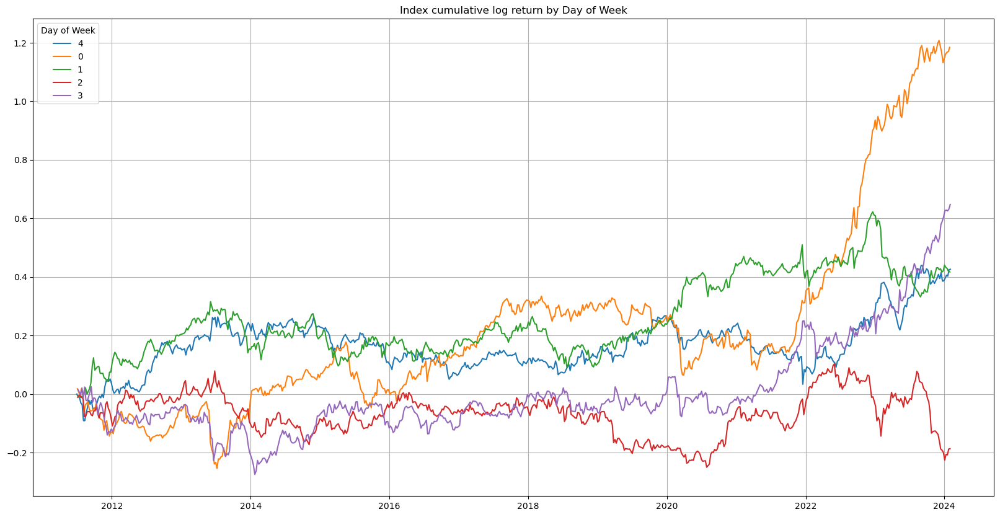

In [ ]:
plt.figure(figsize=(20, 10))
#the total return of the index

for day in daily.index.dayofweek.unique():
    daily_day = daily[daily.index.dayofweek == day]
    plt.plot(daily_day.index, daily_day.co_log_ret.cumsum()+daily_day.gap_log_ret.cumsum(), label=str(day))
plt.title('Index intraday log return by Day of Week')
plt.grid(True)
plt.legend(title='Day of Week')
plt.show()


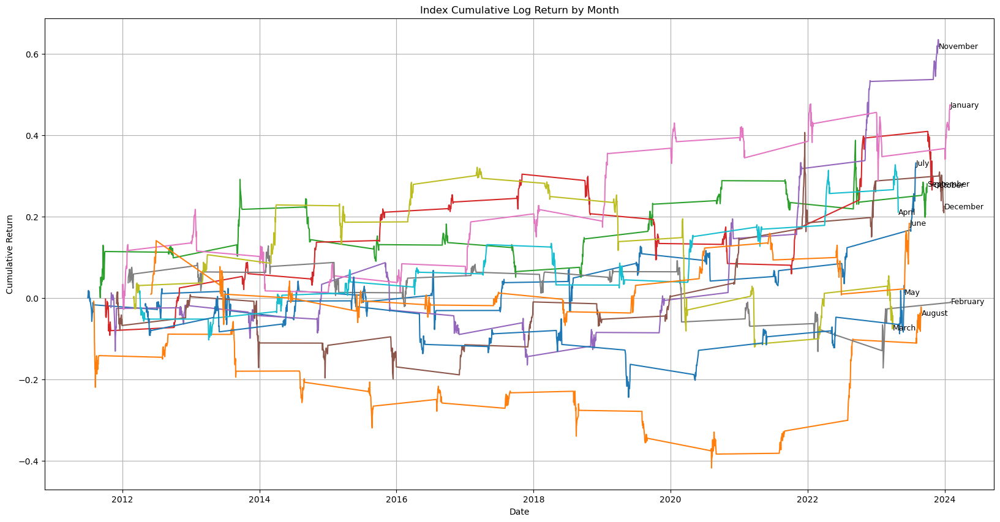

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))

# Loop through each month present in the daily DataFrame
for month in daily.index.month.unique():
    daily_month = daily[daily.index.month == month]

    # Calculate cumulative sum for the month
    cum_sum = daily_month.co_log_ret.cumsum() + daily_month.gap_log_ret.cumsum()

    # Plot the cumulative sum
    plt.plot(daily_month.index, cum_sum, label=str(month))

    # If the line has data, add a text annotation to the last point
    if not cum_sum.empty:
        # Get the last date (x value) and the last cumulative sum (y value)
        last_date = daily_month.index[-1]
        last_value = cum_sum.iloc[-1]
        
        # Convert month number to month name for better readability
        month_name = last_date.strftime('%B')

        # Place the text annotation at the end of each line
        plt.text(last_date, last_value, f'{month_name}', fontsize=9, verticalalignment='center')

plt.grid(True)
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.title('Index Cumulative Log Return by Month')
plt.show()


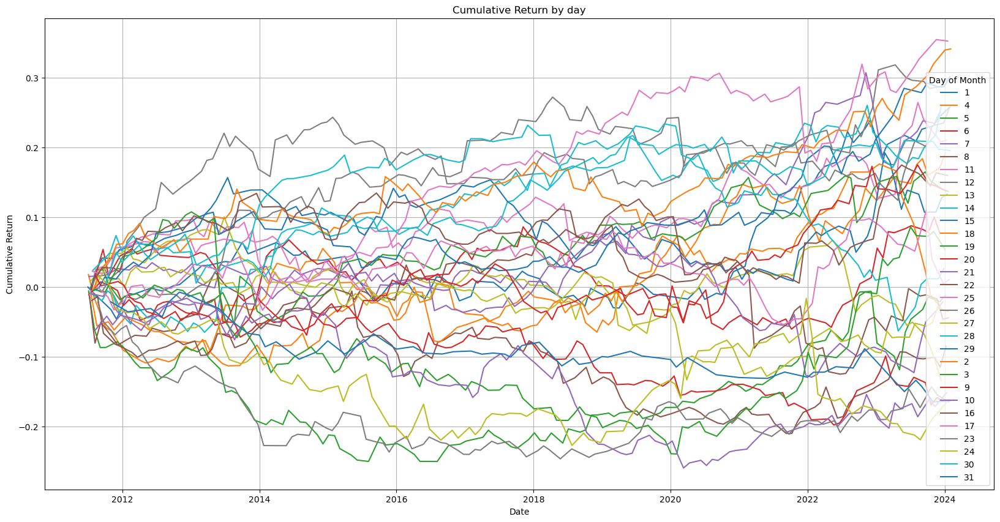

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))

# Loop through each month present in the daily DataFrame
for month in daily.index.day.unique():
    daily_month = daily[daily.index.day == month]

    # Calculate cumulative sum for the month
    cum_sum = daily_month.co_log_ret.cumsum() + daily_month.gap_log_ret.cumsum()

    # Plot the cumulative sum
    plt.plot(daily_month.index, cum_sum, label=str(month))


plt.grid(True)
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.title('Cumulative Return by day')
plt.legend(title='Day of Month')
plt.show()


In [ ]:
daily['rw_adj_co_log_ret']=daily['co_log_ret']-10/24*daily['total_log_ret']
daily['rw_adj_gap_log_ret']=daily['gap_log_ret']-14/24*daily['total_log_ret']
(daily.rw_adj_co_log_ret+daily.rw_adj_gap_log_ret).cumsum().describe()

count    3.160000e+03
mean    -1.050072e-18
std      2.539506e-17
min     -8.654644e-17
25%     -7.209944e-18
50%      5.854692e-18
75%      1.393200e-17
max      4.163336e-17
dtype: float64

Text(0.5, 1.0, 'Cumulative log return of the strategy if Bist30 was not long biased')

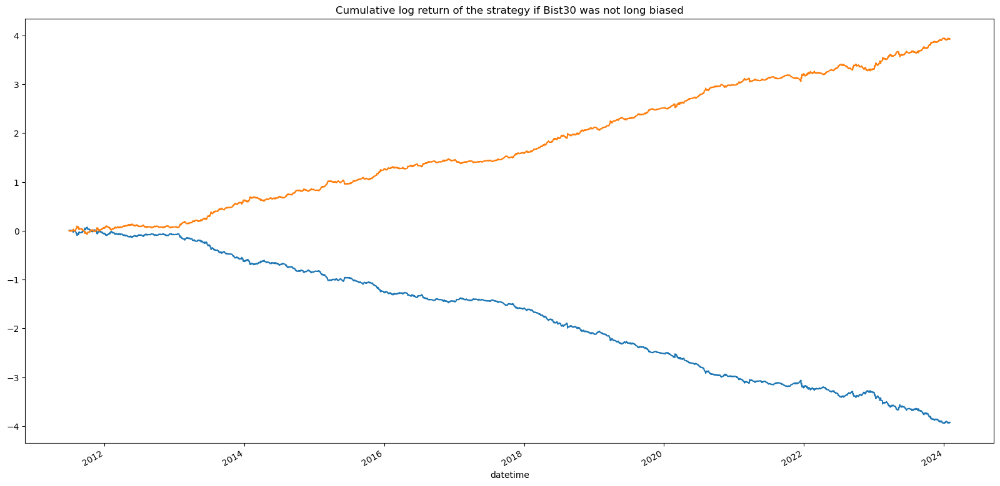

In [ ]:
plt.figure(figsize=(20,10))
daily['rw_adj_co_log_ret'].cumsum().plot()
daily['rw_adj_gap_log_ret'].cumsum().plot()
plt.title('Cumulative log return of the strategy if Bist30 was not long biased')

In [ ]:
daily['mean_adj_co_log_ret']=daily['co_log_ret']-10/24*daily['total_log_ret'].mean()
daily['mean_adj_gap_log_ret']=daily['gap_log_ret']-14/24*daily['total_log_ret'].mean()
(daily.mean_adj_co_log_ret+daily.mean_adj_gap_log_ret).cumsum().describe()

count    3160.000000
mean       -0.667798
std         0.403403
min        -1.450450
25%        -1.022547
50%        -0.693847
75%        -0.312848
max         0.035614
dtype: float64

<Axes: xlabel='datetime'>

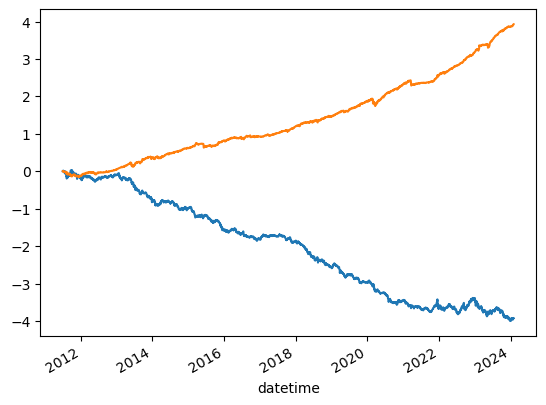

In [ ]:
daily['mean_adj_co_log_ret'].cumsum().plot()
daily['mean_adj_gap_log_ret'].cumsum().plot()

In [ ]:
#regression analysis to see whether the gap is a good predictor of the daily return
import statsmodels.api as sm

ols=sm.OLS(daily.co_log_ret,sm.add_constant(daily.gap_log_ret)).fit()
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             co_log_ret   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.205
Date:                Wed, 07 Feb 2024   Prob (F-statistic):              0.138
Time:                        11:19:05   Log-Likelihood:                 8805.7
No. Observations:                3160   AIC:                        -1.761e+04
Df Residuals:                    3158   BIC:                        -1.760e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -0.0008      0.000     -3.040      0.002      -0.001      -0.000
gap_log_ret    -0.0517      0.035     -1.485      0.138      -0.120       0.017
==============================================================================
Omnibus:                      429.463   Durbin-Watson:                   2.121
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2354.568
Skew:                          -0.522   Prob(JB):                         0.00
Kurtosis:                       7.098   Cond. No.                         131.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
daily['volume']=df.Hacim.groupby(
    df.index.date).sum()

daily.isna().sum()

Açılış                  0
Kapanış                 0
Yüksek                  0
Düşük                   0
co_log_ret              0
gap_log_ret             0
total_log_ret           0
co_log_ret_adj          0
gap_log_ret_adj         0
gap_adj_max_dd          0
index_max_dd            0
rw_adj_co_log_ret       0
rw_adj_gap_log_ret      0
mean_adj_co_log_ret     0
mean_adj_gap_log_ret    0
volume                  0
dtype: int64

In [ ]:
ols=sm.OLS(daily.co_log_ret,sm.add_constant(daily[['gap_log_ret']])).fit()
ols.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:             co_log_ret   R-squared:                       0.001
Model:                            OLS   Adj. R-squared:                  0.000
Method:                 Least Squares   F-statistic:                     2.205
Date:                Wed, 07 Feb 2024   Prob (F-statistic):              0.138
Time:                        11:19:05   Log-Likelihood:                 8805.7
No. Observations:                3160   AIC:                        -1.761e+04
Df Residuals:                    3158   BIC:                        -1.760e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const          -0.0008      0.000     -3.040      0.002      -0.001      -0.000
gap_log_ret    -0.0517      0.035     -1.485      0.138      -0.120       0.017
==============================================================================
Omnibus:                      429.463   Durbin-Watson:                   2.121
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2354.568
Skew:                          -0.522   Prob(JB):                         0.00
Kurtosis:                       7.098   Cond. No.                         131.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
import numpy as np

# Assuming 'daily' is your DataFrame and has been previously defined and preprocessed

# Define your features 'X' and target variable 'y'
X = daily[['total_log_ret']].shift(1)
X['volume'] = np.log(daily.volume / daily.volume.shift(1))
X['gap'] = daily.gap_log_ret
#X['gap_with_volume'] = daily.gap_log_ret * X.volume
X['total_with_volume'] = X.total_log_ret * X.volume
X = X.iloc[5:].replace([np.inf, -np.inf], np.nan).dropna()

y = daily.co_log_ret.loc[X.index]

# Split the data into training and testing sets with 80% training data and 20% testing data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Add a constant to the feature set for the OLS model
X_train_const = sm.add_constant(X_train)
X_test_const = sm.add_constant(X_test)

# Fit the OLS model on the training data
ols = sm.OLS(y_train, X_train_const).fit()

# Print the summary of the OLS model
print(ols.summary())

# If you need to make predictions or evaluate the model, you can use the trained 'ols' model with 'X_test_const'
# For example, to make predictions:
# y_pred = ols.predict(X_test_const)


                            OLS Regression Results                            
Dep. Variable:             co_log_ret   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     4.228
Date:                Wed, 07 Feb 2024   Prob (F-statistic):            0.00206
Time:                        11:19:06   Log-Likelihood:                 7063.6
No. Observations:                2522   AIC:                        -1.412e+04
Df Residuals:                    2517   BIC:                        -1.409e+04
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.0009      0.00

c:\Users\yusuf.bektas\AppData\Local\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [ ]:
from sklearn.metrics import r2_score

r2_score(y_test, ols.predict(X_test_const))

0.016922781615702265

In [ ]:
X_volume=pd.DataFrame()
X_volume['volume_log_diff']=np.log(daily[['volume']]).diff().shift(1)
X_volume['gap_volatility_5D']=daily.gap_log_ret.rolling(5).std().shift(1)
X_volume['co_volatility_5D']=daily.co_log_ret.rolling(5).std().shift(1)
X_volume['gap_volatility']=np.sqrt(daily.gap_log_ret).shift(1)
X_volume['co_volatility']=np.sqrt(daily.co_log_ret).shift(1)
y_volume=np.log(daily.volume).diff()
X_volume=X_volume.iloc[5:].replace([np.inf, -np.inf], np.nan).dropna()
y_volume=y_volume.loc[X_volume.index]
X_volume_train, X_volume_test, y_volume_train, y_volume_test = train_test_split(X_volume, y_volume, test_size=0.2, random_state=42)

ols=sm.OLS(y_volume_train,sm.add_constant(X_volume_train)).fit()
ols.summary()




c:\Users\yusuf.bektas\AppData\Local\anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)
c:\Users\yusuf.bektas\AppData\Local\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\yusuf.bektas\AppData\Local\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: invalid value encountered in sqrt
  result = getattr(ufunc, method)(*inputs, **kwargs)
c:\Users\yusuf.bektas\AppData\Local\anaconda3\Lib\site-packages\pandas\core\arraylike.py:402: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 volume   R-squared:                       0.098
Model:                            OLS   Adj. R-squared:                  0.092
Method:                 Least Squares   F-statistic:                     17.76
Date:                Wed, 07 Feb 2024   Prob (F-statistic):           9.69e-17
Time:                        11:19:06   Log-Likelihood:                -86.760
No. Observations:                 827   AIC:                             185.5
Df Residuals:                     821   BIC:                             213.8
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
=====================================================================================
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                -0.0168      0.029     -0.579      0.562      -0.074       0.040
volume_log_diff      -0.3200      0.034     -9.330      0.000      -0.387      -0.253
gap_volatility_5D    -0.9204      2.163     -0.426      0.671      -5.166       3.325
co_volatility_5D     -4.6371      1.560     -2.972      0.003      -7.700      -1.574
gap_volatility        0.5581      0.324      1.720      0.086      -0.079       1.195
co_volatility         0.8273      0.265      3.123      0.002       0.307       1.347
==============================================================================
Omnibus:                      171.592   Durbin-Watson:                   1.973
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2279.057
Skew:                          -0.523   Prob(JB):                         0.00
Kurtosis:                      11.065   Cond. No.                         245.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [ ]:
#test set
r2_score(y_test,ols.predict(sm.add_constant(X_test))
)

ValueError: shapes (631,5) and (6,) not aligned: 5 (dim 1) != 6 (dim 0)

In [ ]:
#we will calculate the rsi of the mesages count as a feature and to divide the data set into states
def rsi(series, period):
    diff = series.diff().fillna(0)
    pos_diff = pd.Series(np.zeros(diff.shape[0]), index=diff.index)
    neg_diff = pd.Series(np.zeros(diff.shape[0]), index=diff.index)


    pos_diff.loc[diff[diff > 0].index] = diff[diff > 0]
    neg_diff.loc[diff[diff < 0].index] = diff[diff < 0]

 
    total_gain = pos_diff.rolling(period).sum()
    total_loss = neg_diff.rolling(period).sum()

    rs = total_gain / np.abs(total_loss)
    rs = rs.replace([np.inf, -np.inf], np.nan).fillna(0)
    rsi_like = 100 - 100 / (1 + rs)
    return rsi_like

<Axes: xlabel='datetime'>

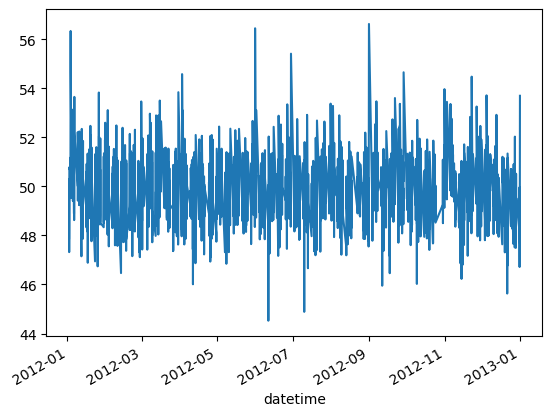

In [ ]:
rsi(df.Hacim,50).loc['2012'].plot()

In [ ]:
daily['volume']=df.Hacim.resample('D').sum().loc[daily.index]
daily['volume_rsi_5D']=rsi(daily['volume'],5)
daily['day_of_week']=daily.index.dayofweek

In [ ]:
import statsmodels.api as sm
X_d=daily[['co_log_ret', 'gap_log_ret','volume_rsi_5D','day_of_week']].dropna()

for col in ['co_log_ret']:
    for i in range(1,5):
        X_d[f'{col}_l_{i}']=X_d[col].shift(i)


X_d['gap_log_ret_cum_1D']=X_d.gap_log_ret.rolling("1D").sum()
X_d['gap_log_ret_cum_5D']=X_d.gap_log_ret.rolling("5D").sum()
X_d['volume_rsi_5D_diff']=X_d.volume_rsi_5D.diff()

X_d=X_d.dropna()
y_d=daily.gap_log_ret.shift(-1).dropna()
y_d=y_d.loc[y_d.index.intersection(X_d.index)]
X_d=X_d.loc[y_d.index.intersection(X_d.index)]
ols_d=sm.OLS(y_d,sm.add_constant(X_d)).fit()
ols_d.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:            gap_log_ret   R-squared:                       0.008
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     2.601
Date:                Tue, 06 Feb 2024   Prob (F-statistic):            0.00383
Time:                        20:43:26   Log-Likelihood:                 10920.
No. Observations:                3155   AIC:                        -2.182e+04
Df Residuals:                    3144   BIC:                        -2.175e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
const                  0.0025      0.001      4.992      0.000       0.002       0.004
co_log_ret             0.0263      0.009      2.877      0.004       0.008       0.044
gap_log_ret           -0.0217      0.010     -2.078      0.038      -0.042      -0.001
volume_rsi_5D      -8.377e-06   9.08e-06     -0.923      0.356   -2.62e-05    9.42e-06
day_of_week           -0.0002   9.65e-05     -2.398      0.017      -0.000   -4.22e-05
co_log_ret_l_1        -0.0100      0.009     -1.086      0.278      -0.028       0.008
co_log_ret_l_2         0.0151      0.009      1.635      0.102      -0.003       0.033
co_log_ret_l_3         0.0058      0.009      0.628      0.530      -0.012       0.024
co_log_ret_l_4         0.0004      0.009      0.049      0.961      -0.018       0.018
gap_log_ret_cum_1D    -0.0217      0.010     -2.078      0.038      -0.042      -0.001
gap_log_ret_cum_5D     0.0233      0.011      2.202      0.028       0.003       0.044
volume_rsi_5D_diff   1.35e-06   8.33e-06      0.162      0.871    -1.5e-05    1.77e-05
==============================================================================
Omnibus:                     1735.292   Durbin-Watson:                   1.997
Prob(Omnibus):                  0.000   Jarque-Bera (JB):           126204.055
Skew:                          -1.775   Prob(JB):                         0.00
Kurtosis:                      33.780   Cond. No.                     1.46e+19
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 4.09e-32. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [ ]:
import yfinance as yf
import pandas as pd
import datetime  # Import the datetime library

# Ticker symbols for the 10 largest stock indices
tickers = ['^GSPC', '^DJI', '^IXIC', '^NYA', '^N225', '^SSEC', '^FTSE', '^GDAXI', '^FCHI', '^HSI']

# Start date and dynamically setting the end date to today
start_date = '2011-01-01'
end_date = datetime.date.today().strftime('%Y-%m-%d')  # Get today's date in the correct format

# Dictionary to store the DataFrames
data_dict = {}

# Loop through each ticker symbol and download the data
for ticker in tickers:
    print(f"Downloading data for {ticker}")
    try:
        data = yf.download(ticker, start=start_date, end=end_date, interval='1d')
        data_dict[ticker] = data
        print(f"Completed: {ticker}")
    except Exception as e:
        print(f"Failed to download {ticker}: {e}")

print("Data download complete.")



[*********************100%%**********************]  1 of 1 completed
Completed: ^GSPC
[*********************100%%**********************]  1 of 1 completed
Completed: ^DJI
[*********************100%%**********************]  1 of 1 completed
Completed: ^IXIC
[*********************100%%**********************]  1 of 1 completed
Completed: ^NYA
[*********************100%%**********************]  1 of 1 completed
Completed: ^N225
[*********************100%%**********************]  1 of 1 completed



1 Failed download:
['^SSEC']: Exception('%ticker%: No timezone found, symbol may be delisted')


Completed: ^SSEC
[*********************100%%**********************]  1 of 1 completed
Completed: ^FTSE
[*********************100%%**********************]  1 of 1 completed
Completed: ^GDAXI
[*********************100%%**********************]  1 of 1 completed
Completed: ^FCHI
[*********************100%%**********************]  1 of 1 completed
Completed: ^HSI
Data download complete.


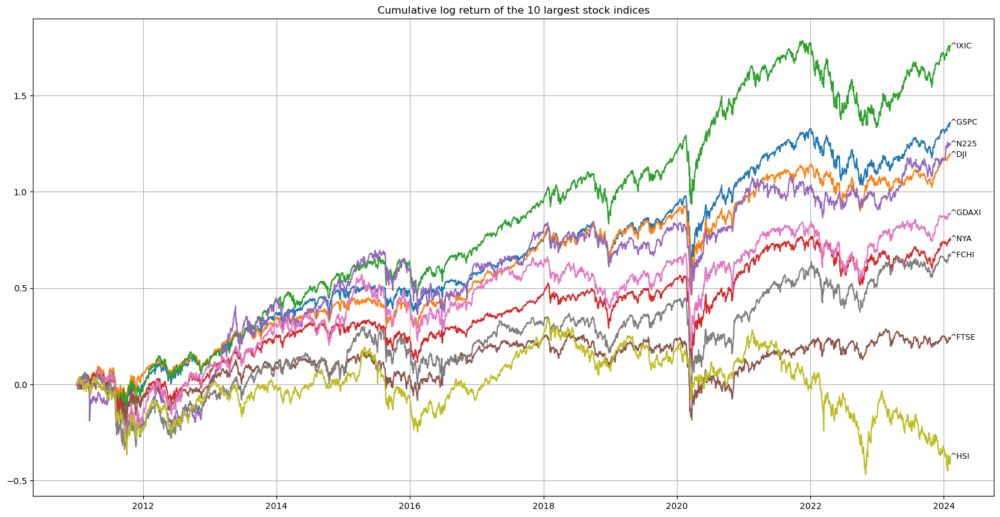

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(20, 10))

for ticker in data_dict.keys():
    # Ensure DataFrame is not empty
    if not data_dict[ticker].empty:
        data_dict[ticker]['co_log_ret'] = np.log(data_dict[ticker]['Close'] / data_dict[ticker]['Open'])
        data_dict[ticker]['gap_log_ret'] = np.log(data_dict[ticker]['Open'] / data_dict[ticker]['Close'].shift(1))
        data_dict[ticker]['total_log_ret'] = data_dict[ticker]['co_log_ret'] + data_dict[ticker]['gap_log_ret']
        data_dict[ticker] = data_dict[ticker].dropna()

        cumulative_log_ret = data_dict[ticker]['total_log_ret'].cumsum()
        plt.plot(cumulative_log_ret, label=ticker)

        # Annotate the last point of each line with the ticker name, if there are points to plot
        if not cumulative_log_ret.empty:
            last_date = cumulative_log_ret.index[-1]
            last_value = cumulative_log_ret.iloc[-1]
            plt.text(last_date, last_value, ticker, fontsize=9, verticalalignment='center')
        

plt.title('Cumulative log return of the 10 largest stock indices')
plt.grid(True)
plt.show()


In [ ]:
key_to_rem=None
for key in data_dict.keys():
    if data_dict[key].empty:
        print(f"Empty DataFrame for {key}")
        key_to_rem = key
if key_to_rem is not None:
    del data_dict[key_to_rem]
    
    

Empty DataFrame for ^SSEC


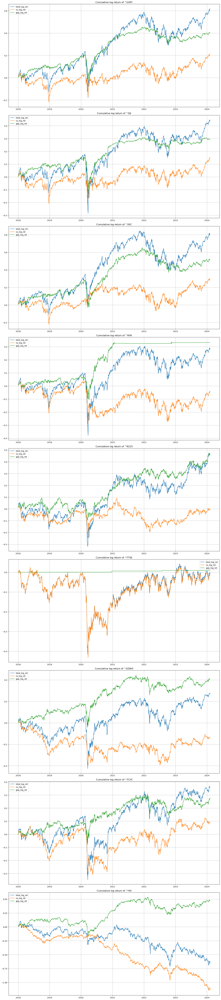

In [ ]:
import matplotlib.pyplot as plt
#removing ftse
#del data_dict['^FTSE']
fig, axs = plt.subplots(len(data_dict.keys()), 1, figsize=(16, 8 * len(data_dict.keys())), squeeze=False)

for idx, ticker in enumerate(data_dict):
    # Access the current axis for plotting
    ax = axs[idx, 0]
    
    ax.set_title(f'Cumulative log return of {ticker}')
    ax.grid(True)
    
    # Plot cumulative log returns for each type
    ax.plot(data_dict[ticker]['total_log_ret'].loc[data_dict[ticker].index.year>2017].cumsum(), label="total_log_ret")
    ax.plot(data_dict[ticker]['co_log_ret'].loc[data_dict[ticker].index.year>2017].cumsum(), label="co_log_ret")
    ax.plot(data_dict[ticker]['gap_log_ret'].loc[data_dict[ticker].index.year>2017].cumsum(), label="gap_log_ret")
    
    # Add legend to each subplot
    ax.legend()

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


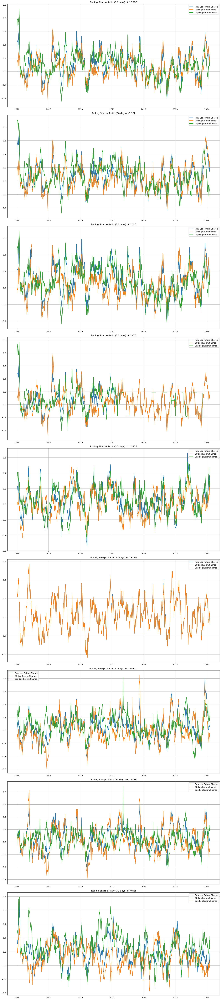

In [ ]:
import matplotlib.pyplot as plt

# Define the rolling window period
metric_period = 30

# Create the figure and axes for subplots
fig, axs = plt.subplots(len(data_dict.keys()), 1, figsize=(16, 8 * len(data_dict.keys())), squeeze=False)

for idx, ticker in enumerate(data_dict):
    # Access the current axis for plotting
    ax = axs[idx, 0]
    
    ax.set_title(f'Rolling Sharpe Ratio ({metric_period} days) of {ticker}')
    ax.grid(True)
    
    # Calculate rolling Sharpe ratio for total_log_ret
    total_sharpe = (data_dict[ticker]['total_log_ret'].rolling(metric_period).mean() / 
                    data_dict[ticker]['total_log_ret'].rolling(metric_period).std())
    
    # Calculate rolling Sharpe ratio for co_log_ret
    co_sharpe = (data_dict[ticker]['co_log_ret'].rolling(metric_period).mean() / 
                 data_dict[ticker]['co_log_ret'].rolling(metric_period).std())
    
    # Calculate rolling Sharpe ratio for gap_log_ret
    gap_sharpe = (data_dict[ticker]['gap_log_ret'].rolling(metric_period).mean() / 
                  data_dict[ticker]['gap_log_ret'].rolling(metric_period).std())
    
    # Plot the rolling Sharpe ratios
    ax.plot(total_sharpe.loc[data_dict[ticker].index.year > 2017], label="Total Log Return Sharpe")
    ax.plot(co_sharpe.loc[data_dict[ticker].index.year > 2017], label="CO Log Return Sharpe")
    ax.plot(gap_sharpe.loc[data_dict[ticker].index.year > 2017], label="Gap Log Return Sharpe")
    
    # Add legend to each subplot
    ax.legend()

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


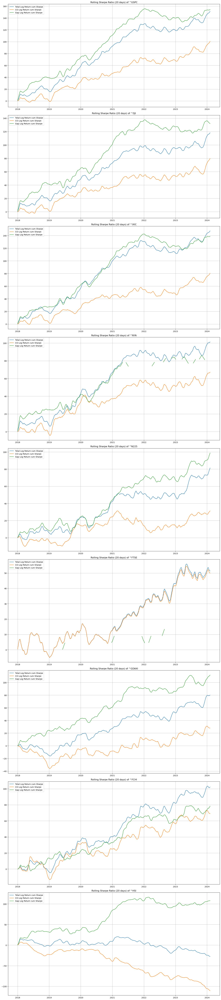

In [ ]:
import matplotlib.pyplot as plt

# Define the rolling window period
metric_period = 20

# Create the figure and axes for subplots
fig, axs = plt.subplots(len(data_dict.keys()), 1, figsize=(16, 8 * len(data_dict.keys())), squeeze=False)

for idx, ticker in enumerate(data_dict):
    # Access the current axis for plotting
    ax = axs[idx, 0]
    
    ax.set_title(f'Rolling Sharpe Ratio ({metric_period} days) of {ticker}')
    ax.grid(True)
    
    # Calculate rolling Sharpe ratio for total_log_ret
    total_sharpe = (data_dict[ticker]['total_log_ret'].rolling(metric_period).mean() / 
                    data_dict[ticker]['total_log_ret'].rolling(metric_period).std())
    
    # Calculate rolling Sharpe ratio for co_log_ret
    co_sharpe = (data_dict[ticker]['co_log_ret'].rolling(metric_period).mean() / 
                 data_dict[ticker]['co_log_ret'].rolling(metric_period).std())
    
    # Calculate rolling Sharpe ratio for gap_log_ret
    gap_sharpe = (data_dict[ticker]['gap_log_ret'].rolling(metric_period).mean() / 
                  data_dict[ticker]['gap_log_ret'].rolling(metric_period).std())
    
    # Plot the rolling Sharpe ratios
    ax.plot(total_sharpe.loc[data_dict[ticker].index.year > 2017].cumsum(), label="Total Log Return cum Sharpe")
    ax.plot(co_sharpe.loc[data_dict[ticker].index.year > 2017].cumsum(), label="CO Log Return cum Sharpe")
    ax.plot(gap_sharpe.loc[data_dict[ticker].index.year > 2017].cumsum(), label="Gap Log Return cum Sharpe")
    
    # Add legend to each subplot
    ax.legend()

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()


In [ ]:
import yfinance as yf

# Ticker symbols for stock indices of developing countries
dev_tickers = {
    'Bovespa': '^BVSP',
    'RTS': '^RTSI',  # Note: Data availability might be restricted
    'BSE': '^BSESN',
    'SSE': '000001.SS',
    'JSE': '^J203',  # or 'JSE.JO'
    'Mexico IPC': '^MXX',
    'EGX 30': '^EGX30'
}

# Start and end dates
start_date = '2011-01-01'  # Example start date
end_date = 'today'  # Assuming 'today' is properly formatted or replaced with current date

# Initialize dictionary to store the data
dev_data_dict = {}

# Download and store the data
for name, ticker in dev_tickers.items():
    print(f"Downloading data for {name} ({ticker})")
    try:
        data = yf.download(ticker, start=start_date, end=end_date, interval='1d')
        dev_data_dict[name] = data
    except Exception as e:
        print(f"Failed to download data for {name} ({ticker}): {e}")

print("Data download for developing country indices complete.")


[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['^BVSP']: ValueError("time data 'today' does not match format '%Y-%m-%d'")



[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['^RTSI']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['^BSESN']: ValueError("time data 'today' does not match format '%Y-%m-%d'")



[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['000001.SS']: ValueError("time data 'today' does not match format '%Y-%m-%d'")



[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['^J203']: Exception('%ticker%: No timezone found, symbol may be delisted')



[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['^MXX']: ValueError("time data 'today' does not match format '%Y-%m-%d'")



[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['^EGX30']: Exception('%ticker%: No timezone found, symbol may be delisted')



Data download for developing country indices complete.


In [ ]:
import yfinance as yf
import pandas as pd
import datetime  # Import the datetime library

# Updated ticker symbols for stock indices of developing countries
dev_tickers = {
    'Bovespa': '^BVSP',       # Brazil
    'RTS': 'RTSI.ME',         # Russia, corrected ticker symbol
    'BSE': '^BSESN',          # India
    'SSE': '000001.SS',       # China, Shanghai Stock Exchange
    'JSE': '^J203',           # South Africa, Johannesburg Stock Exchange
    'Mexico IPC': '^MXX',     # Mexico
    'EGX 30': '^EGX30'        # Egypt
}

# Start date and dynamically setting the end date to today
start_date = '2011-01-01'
end_date = datetime.date.today().strftime('%Y-%m-%d')  # Get today's date in the correct format

# Initialize dictionary to store the DataFrames
dev_data_dict = {}

# Loop through each ticker symbol and download the data
for name, ticker in dev_tickers.items():
    print(f"Downloading data for {name} ({ticker})")
    try:
        data = yf.download(ticker, start=start_date, end=end_date, interval='1d')
        dev_data_dict[name] = data
        print(f"Completed: {name} ({ticker})")
    except Exception as e:
        print(f"Failed to download data for {name} ({ticker}): {e}")

print("Data download for developing country indices complete.")


[*********************100%%**********************]  1 of 1 completed
Completed: Bovespa (^BVSP)
[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['RTSI.ME']: Exception("%ticker%: Period 'max' is invalid, must be one of ['1d', '5d']")



Completed: RTS (RTSI.ME)
[*********************100%%**********************]  1 of 1 completed
Completed: BSE (^BSESN)
[*********************100%%**********************]  1 of 1 completed
Completed: SSE (000001.SS)
[*********************100%%**********************]  1 of 1 completed


1 Failed download:


['^J203']: Exception('%ticker%: No timezone found, symbol may be delisted')


Completed: JSE (^J203)
[*********************100%%**********************]  1 of 1 completed
Completed: Mexico IPC (^MXX)
[*********************100%%**********************]  1 of 1 completed


1 Failed download:
['^EGX30']: Exception('%ticker%: No timezone found, symbol may be delisted')



Completed: EGX 30 (^EGX30)
Data download for developing country indices complete.


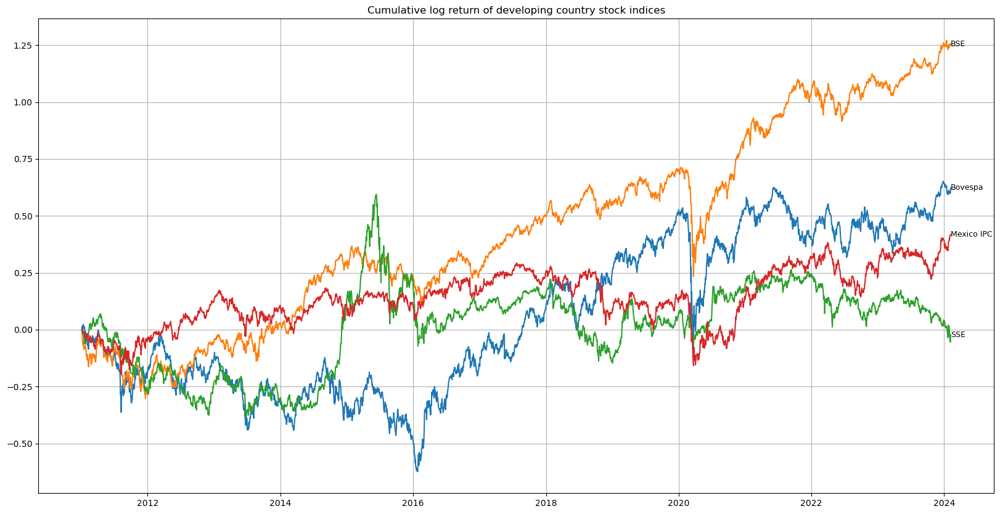

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

plt.figure(figsize=(20, 10))

# Iterate over the new dictionary containing developing country indices data
for name in dev_data_dict.keys():
    # Ensure DataFrame is not empty
    if not dev_data_dict[name].empty:
        dev_data_dict[name]['co_log_ret'] = np.log(dev_data_dict[name]['Close'] / dev_data_dict[name]['Open'])
        dev_data_dict[name]['gap_log_ret'] = np.log(dev_data_dict[name]['Open'] / dev_data_dict[name]['Close'].shift(1))
        dev_data_dict[name]['total_log_ret'] = dev_data_dict[name]['co_log_ret'] + dev_data_dict[name]['gap_log_ret']
        dev_data_dict[name] = dev_data_dict[name].dropna()

        cumulative_log_ret = dev_data_dict[name]['total_log_ret'].cumsum()
        plt.plot(cumulative_log_ret, label=name)

        # Annotate the last point of each line with the index name, if there are points to plot
        if not cumulative_log_ret.empty:
            last_date = cumulative_log_ret.index[-1]
            last_value = cumulative_log_ret.iloc[-1]
            plt.text(last_date, last_value, name, fontsize=9, verticalalignment='center')

plt.title('Cumulative log return of developing country stock indices')
plt.grid(True)
plt.show()


Empty DataFrame for RTS
Empty DataFrame for JSE
Empty DataFrame for EGX 30


C:\Users\yusuf.bektas\AppData\Local\Temp\ipykernel_24088\301411570.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['cumulative_total_log_ret'] = filtered_data['total_log_ret'].cumsum()
C:\Users\yusuf.bektas\AppData\Local\Temp\ipykernel_24088\301411570.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_data['cumulative_co_log_ret'] = filtered_data['co_log_ret'].cumsum()
C:\Users\yusuf.bektas\AppData\Local\Temp\ipykernel_24088\301411570.py:30: SettingWithCopyWarning: 
A value is 

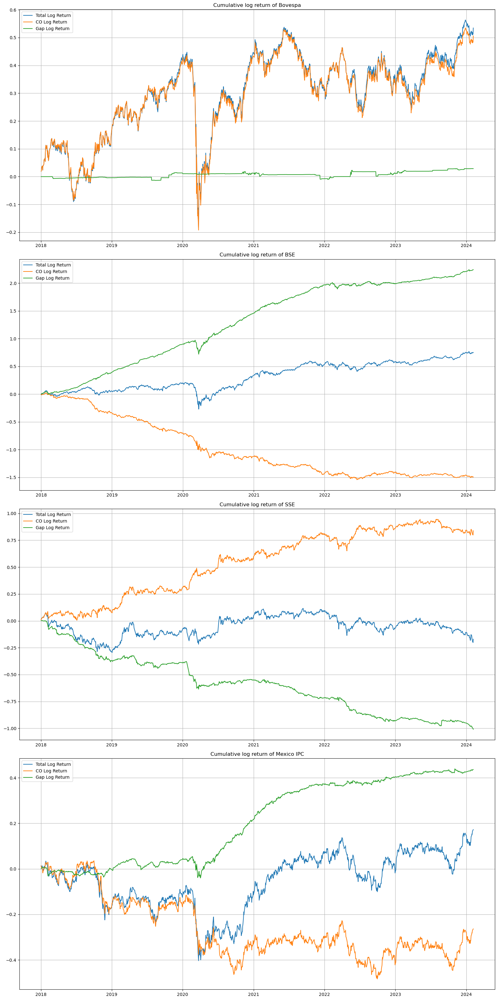

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

tickers_to_remove = []
for name in dev_data_dict:
    if dev_data_dict[name].empty:
        print(f"Empty DataFrame for {name}")
        tickers_to_remove.append(name)

for name in tickers_to_remove:
    del dev_data_dict[name]

# Assuming dev_data_dict is already defined and contains the data for each developing country index

fig, axs = plt.subplots(len(dev_data_dict.keys()), 1, figsize=(16, 8 * len(dev_data_dict.keys())), squeeze=False)

for idx, name in enumerate(dev_data_dict):
    # Access the current axis for plotting
    ax = axs[idx, 0]
    
    ax.set_title(f'Cumulative log return of {name}')
    ax.grid(True)
    
    # Ensure DataFrame is not empty and contains the necessary columns
    if not dev_data_dict[name].empty and {'total_log_ret', 'co_log_ret', 'gap_log_ret'}.issubset(dev_data_dict[name].columns):
        # Filter data from 2018 onwards and calculate cumulative log returns
        filtered_data = dev_data_dict[name].loc[dev_data_dict[name].index.year > 2017]
        filtered_data['cumulative_total_log_ret'] = filtered_data['total_log_ret'].cumsum()
        filtered_data['cumulative_co_log_ret'] = filtered_data['co_log_ret'].cumsum()
        filtered_data['cumulative_gap_log_ret'] = filtered_data['gap_log_ret'].cumsum()

        # Plot cumulative log returns for each type
        ax.plot(filtered_data.index, filtered_data['cumulative_total_log_ret'], label="Total Log Return")
        ax.plot(filtered_data.index, filtered_data['cumulative_co_log_ret'], label="CO Log Return")
        ax.plot(filtered_data.index, filtered_data['cumulative_gap_log_ret'], label="Gap Log Return")

        # Add legend to each subplot
        ax.legend()

plt.tight_layout()  # Adjust layout to prevent overlap
plt.show()
